## Variational Autoencoder

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import plotly.graph_objs as go
from torchsummary import summary
from sklearn.model_selection import train_test_split
from torchview import draw_graph
from torchvision import datasets, transforms

In [2]:
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
print(device)

mps


In [ ]:
transform = transforms.Compose([
    transforms.ast
])

In [13]:
import torch

X = torch.tensor([21., 22., 23., -20])
fc_layer = torch.nn.Linear(4, 2)
out = fc_layer(X)

print(X)
print(out)

tensor([ 21.,  22.,  23., -20.])
tensor([24.7165,  3.8803], grad_fn=<ViewBackward0>)


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                    [-1, 1]               3
Total params: 3
Trainable params: 3
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.00
Params size (MB): 0.00
Estimated Total Size (MB): 0.00
----------------------------------------------------------------
Epoch [100/1000], Loss: 0.9697
Epoch [200/1000], Loss: 0.7834
Epoch [300/1000], Loss: 0.6702
Epoch [400/1000], Loss: 0.5805
Epoch [500/1000], Loss: 0.5092
Epoch [600/1000], Loss: 0.4521
Epoch [700/1000], Loss: 0.4064
Epoch [800/1000], Loss: 0.3697
Epoch [900/1000], Loss: 0.3401
Epoch [1000/1000], Loss: 0.3162


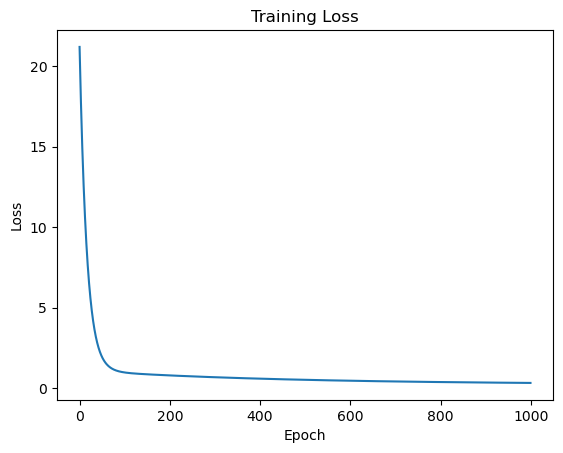

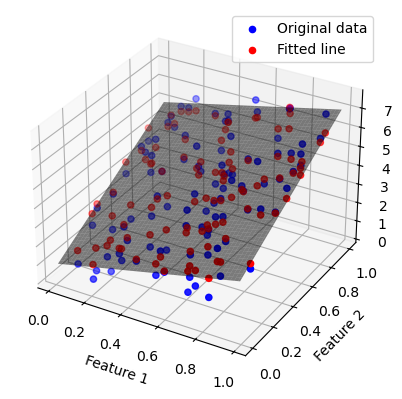

In [20]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from torchsummary import summary

# 1. Generate synthetic data
np.random.seed(0)
torch.manual_seed(0)

# Number of samples
n_samples = 100

# Generate random features
X = np.random.rand(n_samples, 2)
# Generate targets with some noise
Y = 3 * X[:, 0] + 5 * X[:, 1] + np.random.randn(n_samples) * 0.5

# Convert to PyTorch tensors
X_tensor = torch.tensor(X, dtype=torch.float32)
Y_tensor = torch.tensor(Y, dtype=torch.float32).view(-1, 1)

# 2. Define the regression model
class SimpleLinearRegression(nn.Module):
    def __init__(self):
        super(SimpleLinearRegression, self).__init__()
        self.linear = nn.Linear(2, 1)

    def forward(self, x):
        return self.linear(x)

model = SimpleLinearRegression()

# Print the model summary
summary(model, input_size=(2,))

# 3. Train the model
# Define loss function and optimizer
criterion = nn.MSELoss()
optimizer = optim.SGD(model.parameters(), lr=0.01)

# Training loop
num_epochs = 1000
losses = []
for epoch in range(num_epochs):
    # Forward pass
    outputs = model(X_tensor)
    loss = criterion(outputs, Y_tensor)
    
    # Backward pass and optimization
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    
    losses.append(loss.item())

    if (epoch+1) % 100 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')

# 4. Plot the results
# Predicting values
with torch.no_grad():
    predicted = model(X_tensor).numpy()

# Plotting the loss
plt.figure()
plt.plot(losses)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.show()

# Plotting the data and regression plane
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X[:, 0], X[:, 1], Y, color='blue', label='Original data')
ax.scatter(X[:, 0], X[:, 1], predicted, color='red', label='Fitted line')

# Creating a meshgrid for plotting the plane
x_surf, y_surf = np.meshgrid(np.linspace(X[:, 0].min(), X[:, 0].max(), 100),
                             np.linspace(X[:, 1].min(), X[:, 1].max(), 100))
x_surf_flat = x_surf.flatten()
y_surf_flat = y_surf.flatten()
X_surf_tensor = torch.tensor(np.vstack((x_surf_flat, y_surf_flat)).T, dtype=torch.float32)
z_surf_flat = model(X_surf_tensor).detach().numpy().flatten()
z_surf = z_surf_flat.reshape(x_surf.shape)

ax.plot_surface(x_surf, y_surf, z_surf, color='None', alpha=0.5)

ax.set_xlabel('Feature 1')
ax.set_ylabel('Feature 2')
ax.set_zlabel('Target')
ax.legend()
plt.show()


# Variational Auto Encoder

In [1]:
import torch
import numpy as np
import torch.nn as nn
import matplotlib.pyplot as plt
from torchvision.datasets import MNIST
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
from mpl_toolkits.axes_grid1 import ImageGrid
from torchvision.utils import save_image, make_grid

In [2]:
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
print(device)

mps


In [4]:
# create a transofrm to apply to each datapoint
transform = transforms.Compose([transforms.ToTensor()])

# download the MNIST datasets
path = '~/Workshop/dataset'
train_dataset = MNIST(path, transform=transform, download=True, train=True)
validation_dataset  = MNIST(path, transform=transform, download=False, train=False)

In [9]:
len(validation_dataset)

10000

In [11]:
import torch.random


inputs = torch.randn(128, 3)
fc_layer = nn.Linear(3, 2)



tensor([-1.9026, -1.6491,  1.0029])

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import plotly.graph_objs as go
from torchsummary import summary

# 1. Generate synthetic data
np.random.seed(0)
torch.manual_seed(0)

# Number of samples
n_samples = 100

# Generate random features
X = np.random.rand(n_samples, 2)
# Generate targets with some noise
Y = 3 * X[:, 0] + 5 * X[:, 1] + np.random.randn(n_samples) * 0.5

# Convert to PyTorch tensors
X_tensor = torch.tensor(X, dtype=torch.float32)
Y_tensor = torch.tensor(Y, dtype=torch.float32).view(-1, 1)

# 2. Define the regression model
class SimpleLinearRegression(nn.Module):
    def __init__(self):
        super(SimpleLinearRegression, self).__init__()
        self.linear = nn.Linear(2, 1)

    def forward(self, x):
        return self.linear(x)

model = SimpleLinearRegression()

# Print the model summary
summary(model, input_size=(2,))

# 3. Train the model
# Define loss function and optimizer
criterion = nn.MSELoss()
optimizer = optim.SGD(model.parameters(), lr=0.01)

# Training loop
num_epochs = 1000
losses = []
for epoch in range(num_epochs):
    # Forward pass
    outputs = model(X_tensor)
    loss = criterion(outputs, Y_tensor)
    
    # Backward pass and optimization
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    
    losses.append(loss.item())

    if (epoch+1) % 100 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')

# 4. Plot the results
# Predicting values
with torch.no_grad():
    predicted = model(X_tensor).numpy()

# Plotting the data and regression plane
fig = go.Figure()

# Original data
fig.add_trace(go.Scatter3d(x=X[:, 0], y=X[:, 1], z=Y, mode='markers', marker=dict(color='blue'), name='Original data'))
# Fitted line
fig.add_trace(go.Scatter3d(x=X[:, 0], y=X[:, 1], z=predicted.flatten(), mode='markers', marker=dict(color='red'), name='Fitted line'))

# Creating a meshgrid for plotting the plane
x_surf, y_surf = np.meshgrid(np.linspace(X[:, 0].min(), X[:, 0].max(), 100),
                             np.linspace(X[:, 1].min(), X[:, 1].max(), 100))
x_surf_flat = x_surf.flatten()
y_surf_flat = y_surf.flatten()
X_surf_tensor = torch.tensor(np.vstack((x_surf_flat, y_surf_flat)).T, dtype=torch.float32)
z_surf_flat = model(X_surf_tensor).detach().numpy().flatten()
z_surf = z_surf_flat.reshape(x_surf.shape)

fig.add_trace(go.Surface(x=x_surf, y=y_surf, z=z_surf, opacity=0.5, name='Regression Plane'))

# Layout
fig.update_layout(scene=dict(
                    xaxis_title='Feature 1',
                    yaxis_title='Feature 2',
                    zaxis_title='Target'),
                    legend=dict(y=0.5, font_size=12),
                    margin=dict(l=0, r=0, b=0, t=0))

fig.show()


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                    [-1, 1]               3
Total params: 3
Trainable params: 3
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.00
Params size (MB): 0.00
Estimated Total Size (MB): 0.00
----------------------------------------------------------------
Epoch [100/1000], Loss: 0.9697
Epoch [200/1000], Loss: 0.7834
Epoch [300/1000], Loss: 0.6702
Epoch [400/1000], Loss: 0.5805
Epoch [500/1000], Loss: 0.5092
Epoch [600/1000], Loss: 0.4521
Epoch [700/1000], Loss: 0.4064
Epoch [800/1000], Loss: 0.3697
Epoch [900/1000], Loss: 0.3401
Epoch [1000/1000], Loss: 0.3162


In [3]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import plotly.graph_objs as go
from torchsummary import summary

# 1. Generate synthetic data
np.random.seed(0)
torch.manual_seed(0)

# Number of samples
n_samples = 100

# Generate random features
X = np.random.rand(n_samples, 2)
# Generate targets with some noise
Y = 3 * X[:, 0] + 5 * X[:, 1] + np.random.randn(n_samples) * 0.5

# Convert to PyTorch tensors
X_tensor = torch.tensor(X, dtype=torch.float32)
Y_tensor = torch.tensor(Y, dtype=torch.float32).view(-1, 1)

# 2. Define the regression model
class SimpleLinearRegression(nn.Module):
    def __init__(self):
        super(SimpleLinearRegression, self).__init__()
        self.linear = nn.Linear(2, 1)

    def forward(self, x):
        return self.linear(x)

model = SimpleLinearRegression()

# Print the model summary
summary(model, input_size=(2,))

# 3. Train the model
# Define loss function and optimizer
criterion = nn.MSELoss()
optimizer = optim.SGD(model.parameters(), lr=0.01)

# Training loop
num_epochs = 1000
losses = []
for epoch in range(num_epochs):
    # Forward pass
    outputs = model(X_tensor)
    loss = criterion(outputs, Y_tensor)
    
    # Backward pass and optimization
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    
    losses.append(loss.item())

    if (epoch+1) % 100 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')

# 4. Plot the results
# Predicting values
with torch.no_grad():
    predicted = model(X_tensor).numpy()

# Create a meshgrid for plotting the true and predicted surfaces
x_surf, y_surf = np.meshgrid(np.linspace(X[:, 0].min(), X[:, 0].max(), 100),
                             np.linspace(X[:, 1].min(), X[:, 1].max(), 100))

z_true_surf = 3 * x_surf + 5 * y_surf  # True surface
z_predicted_surf = model(torch.tensor(np.vstack((x_surf.flatten(), y_surf.flatten())).T, dtype=torch.float32)).detach().numpy().reshape(x_surf.shape)

# Create a plotly figure
fig = go.Figure()

# Add true function data
fig.add_trace(go.Scatter3d(x=X[:, 0], y=X[:, 1], z=Y, mode='markers', marker=dict(color='blue'), name='True Data'))

# Add predicted function data
# fig.add_trace(go.Scatter3d(x=X[:, 0], y=X[:, 1], z=predicted.flatten(), mode='markers', marker=dict(color='red'), name='Predicted Data'))

# Add true surface
fig.add_trace(go.Surface(x=x_surf, y=y_surf, z=z_true_surf, opacity=0.5, colorscale='Blues', name='True Surface'))

# Add predicted surface
fig.add_trace(go.Surface(x=x_surf, y=y_surf, z=z_predicted_surf, opacity=0.5, colorscale='Reds', name='Predicted Surface'))

# Layout
fig.update_layout(scene=dict(
                    xaxis_title='Feature 1',
                    yaxis_title='Feature 2',
                    zaxis_title='Target'),
                    legend=dict(y=0.5, font_size=12),
                    margin=dict(l=0, r=0, b=0, t=0))

# Show the figure
fig.show()


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                    [-1, 1]               3
Total params: 3
Trainable params: 3
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.00
Params size (MB): 0.00
Estimated Total Size (MB): 0.00
----------------------------------------------------------------
Epoch [100/1000], Loss: 0.9697
Epoch [200/1000], Loss: 0.7834
Epoch [300/1000], Loss: 0.6702
Epoch [400/1000], Loss: 0.5805
Epoch [500/1000], Loss: 0.5092
Epoch [600/1000], Loss: 0.4521
Epoch [700/1000], Loss: 0.4064
Epoch [800/1000], Loss: 0.3697
Epoch [900/1000], Loss: 0.3401
Epoch [1000/1000], Loss: 0.3162


In [4]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import plotly.graph_objs as go
from torchsummary import summary

# 1. Generate synthetic data
np.random.seed(0)
torch.manual_seed(0)

# Number of samples
n_samples = 100

# Generate random features
X = np.random.rand(n_samples, 2)
# Generate targets with some noise
Y = 3 * X[:, 0] + 5 * X[:, 1] + np.random.randn(n_samples) * 0.5

# Convert to PyTorch tensors
X_tensor = torch.tensor(X, dtype=torch.float32)
Y_tensor = torch.tensor(Y, dtype=torch.float32).view(-1, 1)

# 2. Define the regression model
class SimpleLinearRegression(nn.Module):
    def __init__(self):
        super(SimpleLinearRegression, self).__init__()
        self.linear = nn.Linear(2, 1)

    def forward(self, x):
        return self.linear(x)

model = SimpleLinearRegression()

# Print the model summary
summary(model, input_size=(2,))

# 3. Train the model
# Define loss function and optimizer
criterion = nn.MSELoss()
optimizer = optim.SGD(model.parameters(), lr=0.01)

# Training loop
num_epochs = 1000
losses = []
for epoch in range(num_epochs):
    # Forward pass
    outputs = model(X_tensor)
    loss = criterion(outputs, Y_tensor)
    
    # Backward pass and optimization
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    
    losses.append(loss.item())

    if (epoch+1) % 100 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')

# 4. Plot the results
# Predicting values
with torch.no_grad():
    predicted = model(X_tensor).numpy()

# Create a meshgrid for plotting the true and predicted surfaces
x_surf, y_surf = np.meshgrid(np.linspace(X[:, 0].min(), X[:, 0].max(), 100),
                             np.linspace(X[:, 1].min(), X[:, 1].max(), 100))

z_true_surf = 3 * x_surf + 5 * y_surf  # True surface
z_predicted_surf = model(torch.tensor(np.vstack((x_surf.flatten(), y_surf.flatten())).T, dtype=torch.float32)).detach().numpy().reshape(x_surf.shape)

# Create a plotly figure
fig = go.Figure()

# Add true function data
fig.add_trace(go.Scatter3d(x=X[:, 0], y=X[:, 1], z=Y, mode='markers', marker=dict(color='blue'), name='True Data'))

# Add predicted function data
fig.add_trace(go.Scatter3d(x=X[:, 0], y=X[:, 1], z=predicted.flatten(), mode='markers', marker=dict(color='red'), name='Predicted Data'))

# Add true surface
fig.add_trace(go.Surface(x=x_surf, y=y_surf, z=z_true_surf, opacity=0.5, colorscale='blues', name='True Surface'))

# Add predicted surface
fig.add_trace(go.Surface(x=x_surf, y=y_surf, z=z_predicted_surf, opacity=0.5, colorscale='reds', name='Predicted Surface'))

# Layout
fig.update_layout(scene=dict(
                    xaxis_title='Feature 1',
                    yaxis_title='Feature 2',
                    zaxis_title='Target'),
                    legend=dict(y=0.5, font_size=12),
                    margin=dict(l=0, r=0, b=0, t=0))

# Show the figure
fig.show()


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                    [-1, 1]               3
Total params: 3
Trainable params: 3
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.00
Params size (MB): 0.00
Estimated Total Size (MB): 0.00
----------------------------------------------------------------
Epoch [100/1000], Loss: 0.9697
Epoch [200/1000], Loss: 0.7834
Epoch [300/1000], Loss: 0.6702
Epoch [400/1000], Loss: 0.5805
Epoch [500/1000], Loss: 0.5092
Epoch [600/1000], Loss: 0.4521
Epoch [700/1000], Loss: 0.4064
Epoch [800/1000], Loss: 0.3697
Epoch [900/1000], Loss: 0.3401
Epoch [1000/1000], Loss: 0.3162


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import plotly.graph_objs as go
from torchsummary import summary

# 1. Generate synthetic data
np.random.seed(0)
torch.manual_seed(0)

# Number of samples
n_samples = 100

# Generate random features
X = np.random.rand(n_samples, 2)
# Generate targets with some noise
Y = 3 * X[:, 0] + 5 * X[:, 1] + np.random.randn(n_samples) * 0.5

# Convert to PyTorch tensors
X_tensor = torch.tensor(X, dtype=torch.float32)
Y_tensor = torch.tensor(Y, dtype=torch.float32).view(-1, 1)

# 2. Define the regression model
class SimpleLinearRegression(nn.Module):
    def __init__(self):
        super(SimpleLinearRegression, self).__init__()
        self.linear = nn.Linear(2, 5)

    def forward(self, x):
        return self.linear(x)

model = SimpleLinearRegression()

# Print the model summary
summary(model, input_size=(2,))

# 3. Train the model
# Define loss function and optimizer
criterion = nn.MSELoss()
optimizer = optim.SGD(model.parameters(), lr=0.01)

# Training loop
num_epochs = 1000
losses = []
for epoch in range(num_epochs):
    # Forward pass
    outputs = model(X_tensor)
    loss = criterion(outputs, Y_tensor)
    
    # Backward pass and optimization
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    
    losses.append(loss.item())

    if (epoch+1) % 100 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')

# 4. Plot the results
# Predicting values
with torch.no_grad():
    predicted = model(X_tensor).numpy()

# Create a meshgrid for plotting the true and predicted surfaces
x_surf, y_surf = np.meshgrid(np.linspace(X[:, 0].min(), X[:, 0].max(), 100),
                             np.linspace(X[:, 1].min(), X[:, 1].max(), 100))

z_true_surf = 3 * x_surf + 5 * y_surf  # True surface
z_predicted_surf = model(torch.tensor(np.vstack((x_surf.flatten(), y_surf.flatten())).T, dtype=torch.float32)).detach().numpy().reshape(x_surf.shape)

# Create a plotly figure
fig = go.Figure()

# Add true function data
fig.add_trace(go.Scatter3d(x=X[:, 0], y=X[:, 1], z=Y, mode='markers', marker=dict(color='blue'), name='True Data'))

# Add predicted function data
fig.add_trace(go.Scatter3d(x=X[:, 0], y=X[:, 1], z=predicted.flatten(), mode='markers', marker=dict(color='red'), name='Predicted Data'))

# Add true surface
fig.add_trace(go.Surface(x=x_surf, y=y_surf, z=z_true_surf, opacity=0.5, colorscale='blues', name='True Surface'))

# Add predicted surface
fig.add_trace(go.Surface(x=x_surf, y=y_surf, z=z_predicted_surf, opacity=0.5, colorscale='reds', name='Predicted Surface'))

# Layout
fig.update_layout(scene=dict(
                    xaxis_title='Feature 1',
                    yaxis_title='Feature 2',
                    zaxis_title='Target'),
                    legend=dict(y=0.5, font_size=12),
                    margin=dict(l=0, r=0, b=0, t=0))

# Show the figure
fig.show()


In [6]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import plotly.graph_objs as go
from torchsummary import summary
from sklearn.model_selection import train_test_split

# 1. Generate synthetic data
np.random.seed(0)
torch.manual_seed(0)

# Number of samples
n_samples = 100

# Generate random features
X = np.random.rand(n_samples, 2)
# Generate targets with some noise
Y = 3 * X[:, 0] + 5 * X[:, 1] + np.random.randn(n_samples) * 0.5

# Split data into training and validation sets
X_train, X_val, Y_train, Y_val = train_test_split(X, Y, test_size=0.2, random_state=42)

# Convert to PyTorch tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
Y_train_tensor = torch.tensor(Y_train, dtype=torch.float32).view(-1, 1)
X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
Y_val_tensor = torch.tensor(Y_val, dtype=torch.float32).view(-1, 1)

# 2. Define the regression model
class TwoLayerRegression(nn.Module):
    def __init__(self):
        super(TwoLayerRegression, self).__init__()
        self.layer1 = nn.Linear(2, 5)
        self.relu1 = nn.ReLU()
        self.layer2 = nn.Linear(5, 3)
        self.relu2 = nn.ReLU()
        self.layer3 = nn.Linear(3, 1)

    def forward(self, x):
        x = self.relu1(self.layer1(x))
        x = self.relu2(self.layer2(x))
        x = self.layer3(x)
        return x

model = TwoLayerRegression()

# Print the model summary
summary(model, input_size=(2,))

# 3. Train the model
# Define loss function and optimizer
criterion = nn.MSELoss()
optimizer = optim.SGD(model.parameters(), lr=0.01)

# Training loop
num_epochs = 1000
batch_size = 10
train_losses = []
val_losses = []

for epoch in range(num_epochs):
    # Training
    model.train()
    for i in range(0, len(X_train), batch_size):
        # Get batch
        X_batch = X_train_tensor[i:i+batch_size]
        Y_batch = Y_train_tensor[i:i+batch_size]

        # Forward pass
        outputs = model(X_batch)
        loss = criterion(outputs, Y_batch)

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    # Calculate training loss
    model.eval()
    with torch.no_grad():
        train_outputs = model(X_train_tensor)
        train_loss = criterion(train_outputs, Y_train_tensor)
        train_losses.append(train_loss.item())

        # Calculate validation loss
        val_outputs = model(X_val_tensor)
        val_loss = criterion(val_outputs, Y_val_tensor)
        val_losses.append(val_loss.item())

    if (epoch+1) % 100 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Training Loss: {train_loss.item():.4f}, Validation Loss: {val_loss.item():.4f}')

# 4. Plot the results
# Plot training and validation losses
epochs = np.arange(1, num_epochs + 1)
fig = go.Figure()
fig.add_trace(go.Scatter(x=epochs, y=train_losses, mode='lines', name='Training Loss'))
fig.add_trace(go.Scatter(x=epochs, y=val_losses, mode='lines', name='Validation Loss'))
fig.update_layout(title='Training and Validation Losses',
                  xaxis_title='Epoch',
                  yaxis_title='Loss')
fig.show()


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                    [-1, 5]              15
              ReLU-2                    [-1, 5]               0
            Linear-3                    [-1, 3]              18
              ReLU-4                    [-1, 3]               0
            Linear-5                    [-1, 1]               4
Total params: 37
Trainable params: 37
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.00
Params size (MB): 0.00
Estimated Total Size (MB): 0.00
----------------------------------------------------------------
Epoch [100/1000], Training Loss: 2.8507, Validation Loss: 2.2372
Epoch [200/1000], Training Loss: 2.8507, Validation Loss: 2.2372
Epoch [300/1000], Training Loss: 2.8507, Validation Loss: 2.2372
Epoch [400/1000], Training Loss: 2.8507, Validati

In [9]:
epochs = np.arange(1, num_epochs + 1)
fig_losses = go.Figure()
fig_losses.add_trace(go.Scatter(x=epochs, y=train_losses, mode='lines', name='Training Loss'))
fig_losses.add_trace(go.Scatter(x=epochs, y=val_losses, mode='lines', name='Validation Loss'))
fig_losses.update_layout(title='Training and Validation Losses',
                         xaxis_title='Epoch',
                         yaxis_title='Loss')

# Predicted vs. True surface plot
Y_pred_train = model(X_train_tensor).detach().numpy()
Y_pred_val = model(X_val_tensor).detach().numpy()

fig_surface = go.Figure()
fig_surface.add_trace(go.Surface(x=X_train[:, 0], y=X_train[:, 1], z=Y_pred_train.flatten(),
                                 opacity=0.5, colorscale='reds', name='Predicted (Training)'))
fig_surface.add_trace(go.Surface(x=X_val[:, 0], y=X_val[:, 1], z=Y_pred_val.flatten(),
                                 opacity=0.5, colorscale='blues', name='Predicted (Validation)'))
fig_surface.add_trace(go.Surface(x=X_train[:, 0], y=X_train[:, 1], z=Y,
                                 opacity=0.5, colorscale='greens', name='True (Training)'))
fig_surface.add_trace(go.Surface(x=X_val[:, 0], y=X_val[:, 1], z=Y_val,
                                 opacity=0.5, colorscale='purples', name='True (Validation)'))
fig_surface.update_layout(title='Predicted vs. True Surface Plot')

fig_losses.show()
fig_surface.show()

In [22]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import plotly.graph_objs as go
from torchsummary import summary
from sklearn.model_selection import train_test_split

# 1. Generate synthetic data
np.random.seed(0)
torch.manual_seed(0)

# Number of samples
n_samples = 100

# Generate random features
X = np.random.rand(n_samples, 2)
# Generate targets with some noise
Y = 3 * X[:, 0] + 5 * X[:, 1] + np.random.randn(n_samples) * 0.5

# Split data into training and validation sets
X_train, X_val, Y_train, Y_val = train_test_split(X, Y, test_size=0.2, random_state=42)

# Convert to PyTorch tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
Y_train_tensor = torch.tensor(Y_train, dtype=torch.float32).view(-1, 1)
X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
Y_val_tensor = torch.tensor(Y_val, dtype=torch.float32).view(-1, 1)

# 2. Define the regression model
class TwoLayerRegression(nn.Module):
    def __init__(self):
        super(TwoLayerRegression, self).__init__()
        self.layer1 = nn.Linear(2, 5)
        self.relu1 = nn.ReLU()
        self.layer2 = nn.Linear(5, 3)
        self.relu2 = nn.ReLU()
        self.layer3 = nn.Linear(2, 1)

    def forward(self, x):
        # x = self.relu1(self.layer1(x))
        # x = self.relu2(self.layer2(x))
        x = self.layer3(x)
        return x

model = TwoLayerRegression()

# Print the model summary
summary(model, input_size=(2,))

# 3. Train the model
# Define loss function and optimizer
criterion = nn.MSELoss()
optimizer = optim.SGD(model.parameters(), lr=0.01)

# Training loop
num_epochs = 1000
batch_size = 10
train_losses = []
val_losses = []

for epoch in range(num_epochs):
    # Training
    model.train()
    for i in range(0, len(X_train), batch_size):
        # Get batch
        X_batch = X_train_tensor[i:i+batch_size]
        Y_batch = Y_train_tensor[i:i+batch_size]

        # Forward pass
        outputs = model(X_batch)
        loss = criterion(outputs, Y_batch)

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    # Calculate training loss
    model.eval()
    with torch.no_grad():
        train_outputs = model(X_train_tensor)
        train_loss = criterion(train_outputs, Y_train_tensor)
        train_losses.append(train_loss.item())

        # Calculate validation loss
        val_outputs = model(X_val_tensor)
        val_loss = criterion(val_outputs, Y_val_tensor)
        val_losses.append(val_loss.item())

    if (epoch+1) % 100 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Training Loss: {train_loss.item():.4f}, Validation Loss: {val_loss.item():.4f}')

# 4. Plot the results
# Plot training and validation losses
epochs = np.arange(1, num_epochs + 1)
fig_losses = go.Figure()
fig_losses.add_trace(go.Scatter(x=epochs, y=train_losses, mode='lines', name='Training Loss'))
fig_losses.add_trace(go.Scatter(x=epochs, y=val_losses, mode='lines', name='Validation Loss'))
fig_losses.update_layout(title='Training and Validation Losses',
                         xaxis_title='Epoch',
                         yaxis_title='Loss')

# Create a plotly figure
# Create a meshgrid for plotting the true and predicted surfaces
x_surf, y_surf = np.meshgrid(np.linspace(X[:, 0].min(), X[:, 0].max(), n_samples),
                             np.linspace(X[:, 1].min(), X[:, 1].max(), n_samples))

z_true_surf = 3 * x_surf + 5 * y_surf  # True surface
z_predicted_surf = model(torch.tensor(np.vstack((x_surf.flatten(), y_surf.flatten())).T, dtype=torch.float32)).detach().numpy().reshape(x_surf.shape)

fig = go.Figure()

# Add true training data
fig.add_trace(go.Scatter3d(x=X_train[:, 0], y=X_train[:, 1], z=Y_train, mode='markers', marker=dict(color='blue'), name='True Data (Training)'))

# Add true validation data
fig.add_trace(go.Scatter3d(x=X_val[:, 0], y=X_val[:, 1], z=Y_val, mode='markers', marker=dict(color='green'), name='True Data (Validation)'))

# Add true function surface
fig.add_trace(go.Surface(x=x_surf, y=y_surf, z=z_true_surf, opacity=0.5, colorscale='blues', name='True Function Surface'))

# Add predicted Y surface
fig.add_trace(go.Surface(x=x_surf, y=y_surf, z=z_predicted_surf, opacity=0.5, colorscale='reds', name='Predicted Y Surface'))

# Layout
fig.update_layout(scene=dict(
                    xaxis_title='Feature 1',
                    yaxis_title='Feature 2',
                    zaxis_title='Target'),
                    legend=dict(y=0.5, font_size=12),
                    margin=dict(l=0, r=0, b=0, t=0))

# Show the figure
fig.show()


fig_losses.show()


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                    [-1, 1]               3
Total params: 3
Trainable params: 3
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.00
Params size (MB): 0.00
Estimated Total Size (MB): 0.00
----------------------------------------------------------------
Epoch [100/1000], Training Loss: 0.4324, Validation Loss: 0.3108
Epoch [200/1000], Training Loss: 0.2592, Validation Loss: 0.1975
Epoch [300/1000], Training Loss: 0.2280, Validation Loss: 0.1800
Epoch [400/1000], Training Loss: 0.2218, Validation Loss: 0.1783
Epoch [500/1000], Training Loss: 0.2206, Validation Loss: 0.1788
Epoch [600/1000], Training Loss: 0.2204, Validation Loss: 0.1792
Epoch [700/1000], Training Loss: 0.2203, Validation Loss: 0.1795
Epoch [800/1000], Training Loss: 0.2203, Valida

In [23]:
# Create a meshgrid for plotting the true and predicted surfaces
x_surf, y_surf = np.meshgrid(np.linspace(X[:, 0].min(), X[:, 0].max(), n_samples),
                             np.linspace(X[:, 1].min(), X[:, 1].max(), n_samples))

z_true_surf = 3 * x_surf + 5 * y_surf  # True surface
z_predicted_surf = model(torch.tensor(np.vstack((x_surf.flatten(), y_surf.flatten())).T, dtype=torch.float32)).detach().numpy().reshape(x_surf.shape)

# Create a plotly figure
fig = go.Figure()

# Add true function data
fig.add_trace(go.Scatter3d(x=X[:, 0], y=X[:, 1], z=Y, mode='markers', marker=dict(color='blue'), name='True Data'))

# Add predicted function data
# fig.add_trace(go.Scatter3d(x=X[:, 0], y=X[:, 1], z=predicted.flatten(), mode='markers', marker=dict(color='red'), name='Predicted Data'))

# Add true surface
fig.add_trace(go.Surface(x=x_surf, y=y_surf, z=z_true_surf, opacity=0.5, colorscale='blues', name='True Surface'))

# Add predicted surface
fig.add_trace(go.Surface(x=x_surf, y=y_surf, z=z_predicted_surf, opacity=0.5, colorscale='reds', name='Predicted Surface'))

# Layout
fig.update_layout(scene=dict(
                    xaxis_title='Feature 1',
                    yaxis_title='Feature 2',
                    zaxis_title='Target'),
                    legend=dict(y=0.5, font_size=12),
                    margin=dict(l=0, r=0, b=0, t=0))

# Show the figure
fig.show()

In [12]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import plotly.graph_objs as go
from torchsummary import summary
from sklearn.model_selection import train_test_split

# 1. Generate synthetic data
np.random.seed(0)
torch.manual_seed(0)

# Number of samples
n_samples = 100

# Generate random features
X = np.random.rand(n_samples, 2)
# Generate targets with some noise
Y = 3 * X[:, 0] + 5 * X[:, 1] + np.random.randn(n_samples) * 0.5

# Split data into training and validation sets
X_train, X_val, Y_train, Y_val = train_test_split(X, Y, test_size=0.2, random_state=42)

# Convert to PyTorch tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
Y_train_tensor = torch.tensor(Y_train, dtype=torch.float32).view(-1, 1)
X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
Y_val_tensor = torch.tensor(Y_val, dtype=torch.float32).view(-1, 1)

# 2. Define the regression model
class TwoLayerRegression(nn.Module):
    def __init__(self):
        super(TwoLayerRegression, self).__init__()
        self.layer1 = nn.Linear(2, 5)
        self.relu1 = nn.ReLU()
        self.layer2 = nn.Linear(5, 3)
        self.relu2 = nn.ReLU()
        self.layer3 = nn.Linear(3, 1)

    def forward(self, x):
        x = self.relu1(self.layer1(x))
        x = self.relu2(self.layer2(x))
        x = self.layer3(x)
        return x

model = TwoLayerRegression()

# Print the model summary
summary(model, input_size=(2,))

# 3. Train the model
# Define loss function and optimizer
criterion = nn.MSELoss()
optimizer = optim.SGD(model.parameters(), lr=0.01)

# Training loop
num_epochs = 1000
batch_size = 10
train_losses = []
val_losses = []

for epoch in range(num_epochs):
    # Training
    model.train()
    for i in range(0, len(X_train), batch_size):
        # Get batch
        X_batch = X_train_tensor[i:i+batch_size]
        Y_batch = Y_train_tensor[i:i+batch_size]

        # Forward pass
        outputs = model(X_batch)
        loss = criterion(outputs, Y_batch)

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    # Calculate training loss
    model.eval()
    with torch.no_grad():
        train_outputs = model(X_train_tensor)
        train_loss = criterion(train_outputs, Y_train_tensor)
        train_losses.append(train_loss.item())

        # Calculate validation loss
        val_outputs = model(X_val_tensor)
        val_loss = criterion(val_outputs, Y_val_tensor)
        val_losses.append(val_loss.item())

    if (epoch+1) % 100 == 0:
        print(f'Epoch [{epoch+1}/{num_epochs}], Training Loss: {train_loss.item():.4f}, Validation Loss: {val_loss.item():.4f}')

# 4. Plot the results
# Plot training and validation losses
epochs = np.arange(1, num_epochs + 1)
fig_losses = go.Figure()
fig_losses.add_trace(go.Scatter(x=epochs, y=train_losses, mode='lines', name='Training Loss'))
fig_losses.add_trace(go.Scatter(x=epochs, y=val_losses, mode='lines', name='Validation Loss'))
fig_losses.update_layout(title='Training and Validation Losses',
                         xaxis_title='Epoch',
                         yaxis_title='Loss')

# Predicted vs. True surface plot
# Predicted vs. True surface plot
Y_pred_train = model(X_train_tensor).detach().numpy()
Y_pred_val = model(X_val_tensor).detach().numpy()

fig_surface = go.Figure()
fig_surface.add_trace(go.Scatter3d(x=X_train[:, 0], y=X_train[:, 1], z=Y_pred_train.flatten(),
                                   mode='markers', marker=dict(color='red'), name='Predicted (Training)'))
fig_surface.add_trace(go.Scatter3d(x=X_val[:, 0], y=X_val[:, 1], z=Y_pred_val.flatten(),
                                   mode='markers', marker=dict(color='blue'), name='Predicted (Validation)'))
fig_surface.add_trace(go.Surface(x=X_train[:, 0], y=X_train[:, 1], z=Y,
                                 opacity=0.5, colorscale='greens', name='True (Training)'))
fig_surface.add_trace(go.Surface(x=X_val[:, 0], y=X_val[:, 1], z=Y_val,
                                 opacity=0.5, colorscale='purples', name='True (Validation)'))
fig_surface.update_layout(title='Predicted vs. True Surface Plot',
                          scene=dict(xaxis_title='Feature 1',
                                     yaxis_title='Feature 2',
                                     zaxis_title='Target'))
fig_surface.show()



----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                    [-1, 5]              15
              ReLU-2                    [-1, 5]               0
            Linear-3                    [-1, 3]              18
              ReLU-4                    [-1, 3]               0
            Linear-5                    [-1, 1]               4
Total params: 37
Trainable params: 37
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.00
Params size (MB): 0.00
Estimated Total Size (MB): 0.00
----------------------------------------------------------------
Epoch [100/1000], Training Loss: 2.8507, Validation Loss: 2.2372
Epoch [200/1000], Training Loss: 2.8507, Validation Loss: 2.2372
Epoch [300/1000], Training Loss: 2.8507, Validation Loss: 2.2372
Epoch [400/1000], Training Loss: 2.8507, Validati

In [13]:
# Predicted vs. True surface plot
Y_pred_train = model(X_train_tensor).detach().numpy()
Y_pred_val = model(X_val_tensor).detach().numpy()

fig_surface = go.Figure()
fig_surface.add_trace(go.Surface(x=X_train[:, 0], y=X_train[:, 1], z=Y_pred_train.reshape(X_train.shape[0], -1),
                                 opacity=0.5, colorscale='reds', name='Predicted (Training)'))
fig_surface.add_trace(go.Surface(x=X_val[:, 0], y=X_val[:, 1], z=Y_pred_val.reshape(X_val.shape[0], -1),
                                 opacity=0.5, colorscale='blues', name='Predicted (Validation)'))
fig_surface.add_trace(go.Surface(x=X_train[:, 0], y=X_train[:, 1], z=Y,
                                 opacity=0.5, colorscale='greens', name='True (Training)'))
fig_surface.add_trace(go.Surface(x=X_val[:, 0], y=X_val[:, 1], z=Y_val,
                                 opacity=0.5, colorscale='purples', name='True (Validation)'))
fig_surface.update_layout(title='Predicted vs. True Surface Plot',
                          scene=dict(xaxis_title='Feature 1',
                                     yaxis_title='Feature 2',
                                     zaxis_title='Target'))
fig_surface.show()


In [14]:
# Predicted vs. True surface plot
Y_pred_train = model(X_train_tensor).detach().numpy()
Y_pred_val = model(X_val_tensor).detach().numpy()

# Create surface plot for training set
fig_surface_train = go.Figure(data=[
    go.Surface(x=X_train[:, 0], y=X_train[:, 1], z=Y_pred_train.reshape(X_train.shape[0], -1),
               opacity=0.5, colorscale='reds', name='Predicted (Training)'),
    go.Surface(x=X_train[:, 0], y=X_train[:, 1], z=Y,
               opacity=0.5, colorscale='greens', name='True (Training)')
])
fig_surface_train.update_layout(title='Predicted vs. True Surface Plot (Training)',
                                scene=dict(xaxis_title='Feature 1',
                                           yaxis_title='Feature 2',
                                           zaxis_title='Target'))

# Create surface plot for validation set
fig_surface_val = go.Figure(data=[
    go.Surface(x=X_val[:, 0], y=X_val[:, 1], z=Y_pred_val.reshape(X_val.shape[0], -1),
               opacity=0.5, colorscale='blues', name='Predicted (Validation)'),
    go.Surface(x=X_val[:, 0], y=X_val[:, 1], z=Y_val,
               opacity=0.5, colorscale='purples', name='True (Validation)')
])
fig_surface_val.update_layout(title='Predicted vs. True Surface Plot (Validation)',
                              scene=dict(xaxis_title='Feature 1',
                                         yaxis_title='Feature 2',
                                         zaxis_title='Target'))

fig_surface_train.show()
fig_surface_val.show()


In [26]:
# Create a meshgrid for plotting the true and predicted surfaces
x_surf, y_surf = np.meshgrid(np.linspace(X[:, 0].min(), X[:, 0].max(), n_samples),
                             np.linspace(X[:, 1].min(), X[:, 1].max(), n_samples))

z_true_surf = 3 * x_surf + 5 * y_surf  # True surface
z_predicted_surf_train = model(torch.tensor(np.vstack((X_train[:, 0], X_train[:, 1])).T, dtype=torch.float32)).detach().numpy().reshape(X_train.shape[0], -1)
z_predicted_surf_val = model(torch.tensor(np.vstack((X_val[:, 0], X_val[:, 1])).T, dtype=torch.float32)).detach().numpy().reshape(X_val.shape[0], -1)

# Create a plotly figure
fig = go.Figure()

# Add true function data for training set
fig.add_trace(go.Scatter3d(x=X_train[:, 0], y=X_train[:, 1], z=Y_train, mode='markers', marker=dict(color='blue'), name='True Data (Training)'))

# Add true function data for validation set
fig.add_trace(go.Scatter3d(x=X_val[:, 0], y=X_val[:, 1], z=Y_val, mode='markers', marker=dict(color='green'), name='True Data (Validation)'))

# Add predicted surfaces for training and validation sets
fig.add_trace(go.Surface(x=x_surf, y=y_surf, z=z_true_surf, opacity=0.5, colorscale='blues', name='True Surface'))
fig.add_trace(go.Surface(x=x_surf, y=y_surf, z=z_predicted_surf_train, opacity=0.5, colorscale='reds', name='Predicted Surface (Training)'))
fig.add_trace(go.Surface(x=x_surf, y=y_surf, z=z_predicted_surf_val, opacity=0.5, colorscale='greens', name='Predicted Surface (Validation)'))

# Layout
fig.update_layout(scene=dict(
                    xaxis_title='Feature 1',
                    yaxis_title='Feature 2',
                    zaxis_title='Target'),
                    legend=dict(y=0.5, font_size=12),
                    margin=dict(l=0, r=0, b=0, t=0))

# Show the figure
fig.show()


In [16]:
# Create a meshgrid for plotting the predicted surface
x_surf, y_surf = np.meshgrid(np.linspace(X[:, 0].min(), X[:, 0].max(), n_samples),
                             np.linspace(X[:, 1].min(), X[:, 1].max(), n_samples))

z_predicted_surf = model(torch.tensor(np.vstack((x_surf.flatten(), y_surf.flatten())).T, dtype=torch.float32)).detach().numpy().reshape(x_surf.shape)

# Create a plotly figure
fig = go.Figure()

# Add true validation data
fig.add_trace(go.Scatter3d(x=X_val[:, 0], y=X_val[:, 1], z=Y_val, mode='markers', marker=dict(color='green'), name='True Data (Validation)'))

# Add predicted surface
fig.add_trace(go.Surface(x=x_surf, y=y_surf, z=z_predicted_surf, opacity=0.5, colorscale='reds', name='Predicted Surface'))

# Layout
fig.update_layout(scene=dict(
                    xaxis_title='Feature 1',
                    yaxis_title='Feature 2',
                    zaxis_title='Target'),
                    legend=dict(y=0.5, font_size=12),
                    margin=dict(l=0, r=0, b=0, t=0))

# Show the figure
fig.show()


In [25]:
# Create a meshgrid for plotting the true function surface
x_surf, y_surf = np.meshgrid(np.linspace(X[:, 0].min(), X[:, 0].max(), n_samples),
                             np.linspace(X[:, 1].min(), X[:, 1].max(), n_samples))

z_true_surf = 3 * x_surf + 5 * y_surf  # True function surface

# Create a meshgrid for plotting the predicted surface
x_surf_pred, y_surf_pred = np.meshgrid(np.linspace(X[:, 0].min(), X[:, 0].max(), n_samples),
                                       np.linspace(X[:, 1].min(), X[:, 1].max(), n_samples))

z_predicted_surf = model(torch.tensor(np.vstack((x_surf_pred.flatten(), y_surf_pred.flatten())).T, dtype=torch.float32)).detach().numpy().reshape(x_surf_pred.shape)

# Create a plotly figure
fig = go.Figure()

# Add true validation data
fig.add_trace(go.Scatter3d(x=X_val[:, 0], y=X_val[:, 1], z=Y_val, mode='markers', marker=dict(color='green'), name='True Data (Validation)'))

# Add true function surface
fig.add_trace(go.Surface(x=x_surf, y=y_surf, z=z_true_surf, opacity=0.5, colorscale='blues', name='True Function Surface'))

# Add predicted Y surface
fig.add_trace(go.Surface(x=x_surf_pred, y=y_surf_pred, z=z_predicted_surf, opacity=0.5, colorscale='reds', name='Predicted Y Surface'))

# Layout
fig.update_layout(scene=dict(
                    xaxis_title='Feature 1',
                    yaxis_title='Feature 2',
                    zaxis_title='Target'),
                    legend=dict(y=0.5, font_size=12),
                    margin=dict(l=0, r=0, b=0, t=0))

# Show the figure
fig.show()


In [27]:
# Create a plotly figure
fig = go.Figure()

# Add true training data
fig.add_trace(go.Scatter3d(x=X_train[:, 0], y=X_train[:, 1], z=Y_train, mode='markers', marker=dict(color='blue'), name='True Data (Training)'))

# Add true validation data
fig.add_trace(go.Scatter3d(x=X_val[:, 0], y=X_val[:, 1], z=Y_val, mode='markers', marker=dict(color='green'), name='True Data (Validation)'))

# Add true function surface
fig.add_trace(go.Surface(x=x_surf, y=y_surf, z=z_true_surf, opacity=0.5, colorscale='blues', name='True Function Surface'))

# Add predicted Y surface
fig.add_trace(go.Surface(x=x_surf_pred, y=y_surf_pred, z=z_predicted_surf, opacity=0.5, colorscale='reds', name='Predicted Y Surface'))

# Layout
fig.update_layout(scene=dict(
                    xaxis_title='Feature 1',
                    yaxis_title='Feature 2',
                    zaxis_title='Target'),
                    legend=dict(y=0.5, font_size=12),
                    margin=dict(l=0, r=0, b=0, t=0))

# Show the figure
fig.show()
